# DRONE IMAGERY SEMANTIC SEGMENTATION
Drone Imagery Semantic Segmentation using a DeepLabv3+ model with a Resnet50 backbone. We obtained a 0.5IoU on the test set.
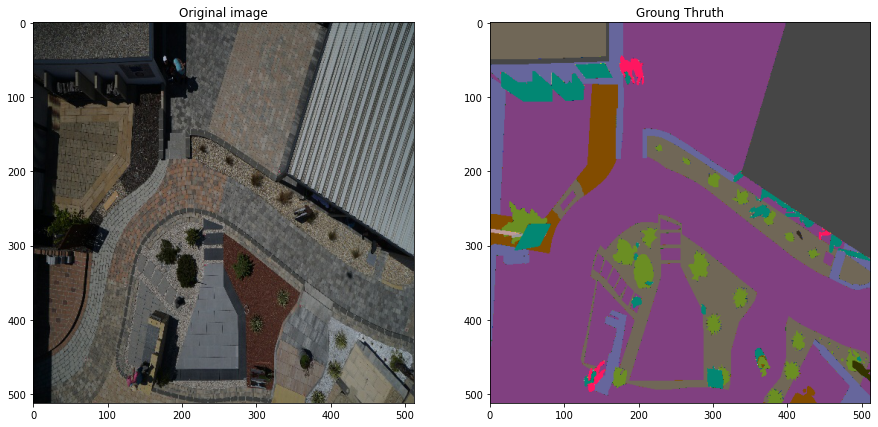


In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.layers import AveragePooling2D, GlobalAveragePooling2D, UpSampling2D, Reshape, Dense, Dropout, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet_v2 import ResNet101V2
from tensorflow.keras.utils import to_categorical   
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from albumentations import (
    Compose, RandomBrightnessContrast, RandomGamma, ISONoise, ShiftScaleRotate, RGBShift, OpticalDistortion, HorizontalFlip, VerticalFlip
)

print(f"GPU AVAILABLE: {tf.test.is_gpu_available()}")

import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

from os import listdir
from os.path import isfile, join

from sklearn.model_selection import train_test_split
from skimage import io
import random
from skimage import transform
from tqdm import tqdm

import numpy as np

from matplotlib import pyplot as plt
import cv2

2022-07-25 08:10:05.569467: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU AVAILABLE: True


2022-07-25 08:10:06.870438: I tensorflow/core/platform/cpu_feature_guard.cc:194] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-25 08:10:06.948478: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:991] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 08:10:06.979476: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:991] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 08:10:06.979641: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:991] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning

# Preprocess and Dataset building
Resize images before start in order to improve the loading time per image.

*Not resized for tree segmentation because we want to preserve image quality for augmentation.*

In [2]:
try:
    os.mkdir('./label_images_semantic')
except Exception as e:
    print(e)
try:
    os.mkdir('./original_images')
except Exception as e:
    print(e)

for image_filename in tqdm(os.listdir('./input/treedata/seg')):
    image = cv2.imread('./input/treedata/seg/'+image_filename, cv2.IMREAD_GRAYSCALE)
    # image = cv2.resize(image, (512,512))
    image = (image > 0).astype(np.uint8)
    cv2.imwrite('./label_images_semantic/'+image_filename, image)
    
for image_filename in tqdm(os.listdir('./input/treedata/img')):
    image = cv2.imread('./input/treedata/img/'+image_filename)
    # image = cv2.resize(image, (512,512))
    cv2.imwrite('./original_images/'+image_filename, image)

[Errno 17] File exists: './label_images_semantic'
[Errno 17] File exists: './original_images'


100%|█████████████████████████████████████████| 424/424 [00:20<00:00, 20.83it/s]


In [14]:
class CustomDataGen(tf.keras.utils.Sequence):
    
    def __init__(self, path,
                 batch_size = 2,
                 shuffle=True, seed = 1, subset = 'training',
                 data_augmentation = False,
                 one_hot = True):
        self.path = path
        self.n_classes = 2 # originally 24
        self.one_hot = one_hot
        self.batch_size = batch_size
        self.data_augmentation = data_augmentation
        
        # self.imageGenerator = ImageDataGenerator(
        #     horizontal_flip = True,
        #     vertical_flip = True,
        #     #fill_mode = 'reflect',
        #     #zoom_range = (0.7, 1.5),
        #     #width_shift_range = 0.2,
        #     #height_shift_range = 0.2,
        #     #rotation_range = 365
        # )

        self.image_transforms = Compose([
            # RandomBrightnessContrast(brightness_limit=(-0.2,0.2), contrast_limit=(-0.2, 0.2), brightness_by_max=True),
            RandomGamma(gamma_limit=(80,120)),
            # ISONoise(color_shift=(0.01, 0.05), intensity=(0.1,0.5)),
            ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=180, border_mode=cv2.BORDER_REFLECT),
            RGBShift(r_shift_limit=5, g_shift_limit=5, b_shift_limit=5),
            # OpticalDistortion(distort_limit=(-0.13,0.75), shift_limit=(-0.05,0.05), border_mode=cv2.BORDER_REFLECT),
            HorizontalFlip(),
            VerticalFlip()
        ])
        
        self.X_paths = [join(f"{path}/original_images/", f) for f in sorted(listdir(f"{path}/original_images/")) if isfile(join(f"{path}/original_images", f))]
        self.y_paths = [join(f"{path}/label_images_semantic/", f) for f in sorted(listdir(f"{path}/label_images_semantic/")) if isfile(join(f"{path}/label_images_semantic/", f))]
        
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X_paths, self.y_paths, test_size=0.1, random_state = seed)
        self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(self.X_train, self.y_train, test_size=0.2, random_state = seed)
        
        if subset == 'training':
            self.X, self.y = self.X_train, self.y_train
                
        elif subset == 'validation':
            self.X, self.y = self.X_val, self.y_val
        else:
            self.X, self.y = self.X_test, self.y_test

        self.n = len(self.X)
    
    def augment(self, image, mask):
        aug_data = self.image_transforms(image=image, mask=mask)
        aug_img = aug_data["image"]
        aug_mask = aug_data["mask"]
        return aug_img, aug_mask

    def on_epoch_end(self):
        pass
    
    def __getitem__(self, index):
        data_x, data_y = [], []
        
        for i in range(self.batch_size):
            # x = io.imread(self.X[self.batch_size * index + i]) / 255          
            x = io.imread(self.X[self.batch_size * index + i])       
            y = io.imread(self.y[self.batch_size * index + i], cv2.IMREAD_GRAYSCALE)
            y = np.expand_dims(y, axis = 2)

            if self.data_augmentation:
                # seed = random.randint(0, 2**32)
                # y = np.expand_dims(y, axis = 2)
                # x, y = self.imageGenerator.random_transform(x, seed), self.imageGenerator.random_transform(y, seed)
                x, y = self.augment(x, y)
           
            x = tf.cast(x/255.0, tf.float32)
            x = tf.image.resize(x, size=[512, 512])
            y = tf.image.resize(y, size=[512, 512], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

            data_x.append(x)
            
            if self.one_hot:
                y = to_categorical(y, self.n_classes)
            data_y.append(y)
            
        return np.array(data_x), np.array(data_y)
    
    def __len__(self):
            
        return self.n // self.batch_size

Color per class and name of each class

In [4]:
# rgb_representations = np.array([(0,0,0), (128,64,128),(130,76,0),(0,102,0), (112,103,87),(28,42,168),(48,41,30), (0,50,89), (107,142,35),(70,70,70), (102,102,156),(254,228,12),
#                       (254,148,12), (190,153,153),(153,153,153), (255,22,96), (102,51,0), (9,143,150), (119,11,32), (51,51,0), (190,250,190), (112,150,146), 
#                        (2,135,115), (255,0,0)], np.uint8)
# classes = ['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 
#            'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']

rgb_representations = np.array([(0,0,0), (0,255,0)])
classes = ['unlabeled', 'tree']

# def print_legend():
#     # rows = 4
#     # cols = 6
#     rows = 1
#     cols = 2
#     fig, axs = plt.subplots(rows,cols, figsize = (6,6))
#     fig.tight_layout()
#     for i in range(rows):
#         for j in range(cols):
#             color = np.zeros((1,1,3), np.uint8)
#             color[:,:] = rgb_representations[i*cols + j]
#             axs[i][j].set_title(classes[i*cols + j])
#             axs[i][j].imshow(color)
            
#             #Eliminar las etiquetas de los ejes
#             axs[i][j].set_xticks([])
#             axs[i][j].set_yticks([])
    
#     plt.show()

def print_legend():
    rows = 1
    cols = 2
    fig, axs = plt.subplots(rows,cols, figsize = (6,6))
    fig.tight_layout()
    for j in range(cols):
        color = np.zeros((1,1,3), np.uint8)
        color[:,:] = rgb_representations[j]
        axs[j].set_title(classes[j])
        axs[j].imshow(color)
        
        #Eliminar las etiquetas de los ejes
        axs[j].set_xticks([])
        axs[j].set_yticks([])
    
    plt.show()
len(classes)

2

We create the 3 datasets (train, validation and testing)

In [15]:
train_datagen = CustomDataGen("./", data_augmentation = True)
val_datagen = CustomDataGen("./", subset = "validation")
test_datagen = CustomDataGen("./", subset = "test")

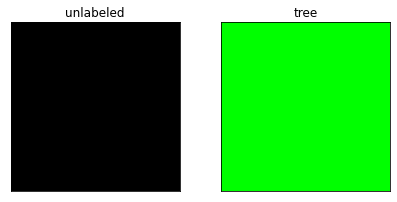

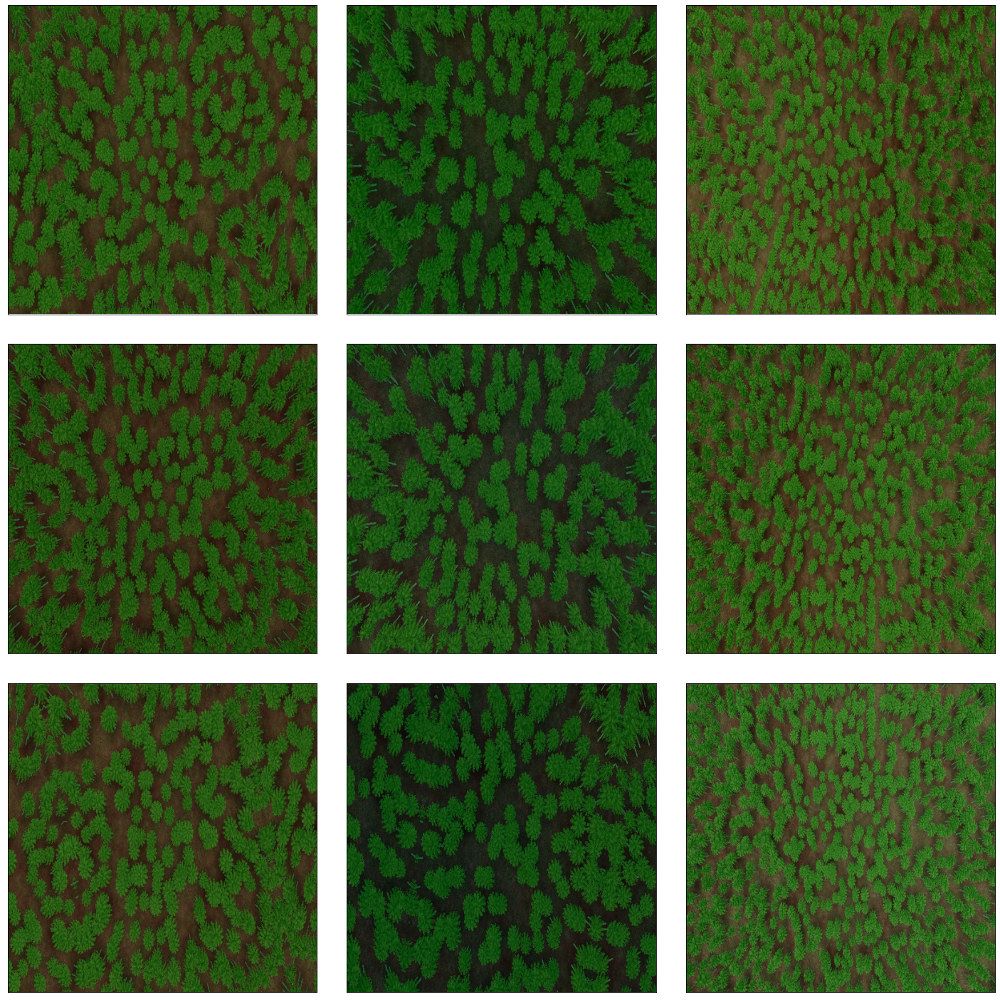

In [16]:
# X, y = train_datagen[25]
# print(f'Gt shape: {y[0].shape}')

print_legend()
# fig, axs = plt.subplots(1, 2, figsize=(15,7))
# axs[0].set_title('Original image')
# axs[0].imshow(X[0])
# axs[1].set_title('Groung Truth')
# axs[1].imshow(rgb_representations[y.argmax(axis = 3)][0])
# plt.show()

rows = 3
cols = 3
fig, axs = plt.subplots(rows, cols, figsize=(20,20))
fig.tight_layout()
for i in range(rows):
    for j in range(cols):
        X, y = train_datagen[25+(rows*3+j)]
        axs[i][j].imshow(X[0])
        axs[i][j].imshow(rgb_representations[y.argmax(axis = 3)][0], alpha=0.2)
        axs[i][j].set_xticks([])
        axs[i][j].set_yticks([])
plt.show()

We use Dice Loss and DeepLabv3+ with Resnet50 backbone

In [17]:
@tf.function
def dice_loss(y_true, y_pred):
    numerator = tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true * y_true) + tf.reduce_sum(y_pred * y_pred) - tf.reduce_sum(y_true * y_pred)

    return 1 - numerator / denominator

class MyMeanIOU(tf.keras.metrics.MeanIoU):
    def update_state(self, y_true, y_pred, sample_weight=None):
        return super().update_state(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1), sample_weight)


def deeplab_plus(input_size = (512,512, 3), n_classes = 24,threshold = 0.5):
    def SqueezeAndExcite(inputs, ratio=8):
        init = inputs
        filters = init.shape[-1]
        se_shape = (1, 1, filters)

        se = GlobalAveragePooling2D()(init)
        se = Reshape(se_shape)(se)
        se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
        se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)
        x = init * se
        return x

    def ASPP(inputs):
        """ Image Pooling """
        shape = inputs.shape
        y1 = AveragePooling2D(pool_size=(shape[1], shape[2]))(inputs)
        y1 = Conv2D(256, 1, padding="same", use_bias=False)(y1)
        y1 = BatchNormalization()(y1)
        y1 = Activation("relu")(y1)
        y1 = UpSampling2D((shape[1], shape[2]), interpolation="bilinear")(y1)

        """ 1x1 conv """
        y2 = Conv2D(256, 1, padding="same", use_bias=False)(inputs)
        y2 = BatchNormalization()(y2)
        y2 = Activation("relu")(y2)

        """ 3x3 conv rate=6 """
        y3 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=6)(inputs)
        y3 = BatchNormalization()(y3)
        y3 = Activation("relu")(y3)

        """ 3x3 conv rate=12 """
        y4 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=12)(inputs)
        y4 = BatchNormalization()(y4)
        y4 = Activation("relu")(y4)

        """ 3x3 conv rate=18 """
        y5 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=18)(inputs)
        y5 = BatchNormalization()(y5)
        y5 = Activation("relu")(y5)

        y = Concatenate()([y1, y2, y3, y4, y5])
        y = Conv2D(256, 1, padding="same", use_bias=False)(y)
        y = BatchNormalization()(y)
        y = Activation("relu")(y)

        return y
        
    
    """ Input """
    inputs = Input(input_size)

    """ Encoder """
    encoder = ResNet50(weights="imagenet", include_top=False, input_tensor=inputs)

    image_features = encoder.get_layer("conv4_block6_out").output
    x_a = ASPP(image_features)
    x_a = UpSampling2D((4, 4), interpolation="bilinear")(x_a)

    x_b = encoder.get_layer("conv2_block2_out").output
    x_b = Conv2D(filters=48, kernel_size=1, padding='same', use_bias=False)(x_b)
    x_b = BatchNormalization()(x_b)
    x_b = Activation('relu')(x_b)

    x = Concatenate()([x_a, x_b])
    x = SqueezeAndExcite(x)

    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = SqueezeAndExcite(x)

    x = UpSampling2D((4, 4), interpolation="bilinear")(x)
    x = Conv2D(n_classes, 1, activation = "softmax")(x)

    model = Model(inputs, x)
    model.compile(optimizer = Adam(lr = 5e-4), loss = dice_loss,
                  metrics = [MyMeanIOU(num_classes = n_classes, name = 'my_mean_iou')])
    return model

In [18]:
model = deeplab_plus(n_classes=2)
# model.load_weights('treeseg_pretrained.h5')

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [20]:
if True:
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                       patience=20)  # Early stopping (stops training when validation doesn't improve for {patience} epochs)
    save_best = tf.keras.callbacks.ModelCheckpoint('best_deeplab.h5', monitor='val_my_mean_iou', save_best_only=True,
                                                    mode='max')  # Saves the best version of the model to disk (as measured on the validation data set)
    learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss',patience = 10,verbose = 1,factor = 0.1)
    remote_monitor_callback = tf.keras.callbacks.RemoteMonitor(
        root='https://dweet.io', path='/dweet/for/semantic-segmentation-training',
        send_as_json=False, field = 'data'
    )    
    
    history = model.fit(train_datagen ,
            epochs=300,
            validation_data=val_datagen,
            shuffle=True,
             callbacks = [es, save_best, learning_rate_reduction, remote_monitor_callback],
                       workers = 2)

    
    plt.rcParams["figure.figsize"] = (5,5)
    plt.plot(history.history['my_mean_iou'])
    plt.plot(history.history['val_my_mean_iou'])
    plt.title('model mean IOU')
    plt.ylabel('mean iou')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.savefig('miou.jpg')
    plt.show()
    
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.savefig('loss.jpg')
    plt.show()
    model.load_weights('./best_deeplab.h5')

Epoch 1/300
152/152 [==============================] - 33s 199ms/step - loss: 0.2032 - my_mean_iou: 0.7453 - val_loss: 0.6210 - val_my_mean_iou: 0.2749 - lr: 5.0000e-04
Epoch 2/300
152/152 [==============================] - 29s 193ms/step - loss: 0.1739 - my_mean_iou: 0.7814 - val_loss: 0.6635 - val_my_mean_iou: 0.2251 - lr: 5.0000e-04
Epoch 3/300
152/152 [==============================] - 31s 204ms/step - loss: 0.1697 - my_mean_iou: 0.7862 - val_loss: 0.6194 - val_my_mean_iou: 0.2788 - lr: 5.0000e-04
Epoch 4/300
152/152 [==============================] - 29s 193ms/step - loss: 0.1663 - my_mean_iou: 0.7903 - val_loss: 0.7053 - val_my_mean_iou: 0.2251 - lr: 5.0000e-04
Epoch 5/300
152/152 [==============================] - 29s 192ms/step - loss: 0.1645 - my_mean_iou: 0.7924 - val_loss: 0.7008 - val_my_mean_iou: 0.2251 - lr: 5.0000e-04
Epoch 6/300
152/152 [==============================] - 29s 192ms/step - loss: 0.1634 - my_mean_iou: 0.7937 - val_loss: 0.7056 - val_my_mean_iou: 0.2251 - l

KeyboardInterrupt: 

In [21]:
model.load_weights('./treeseg_good_epoch_61_lr_5e-6.h5')
model.evaluate(test_datagen)

21/21 [==============================] - 2s 97ms/step - loss: 0.1556 - my_mean_iou: 0.8023


[0.1556408554315567, 0.8023401498794556]

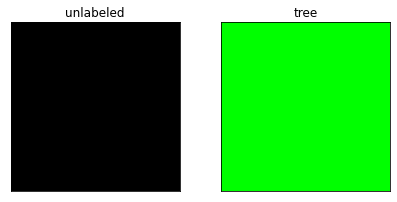

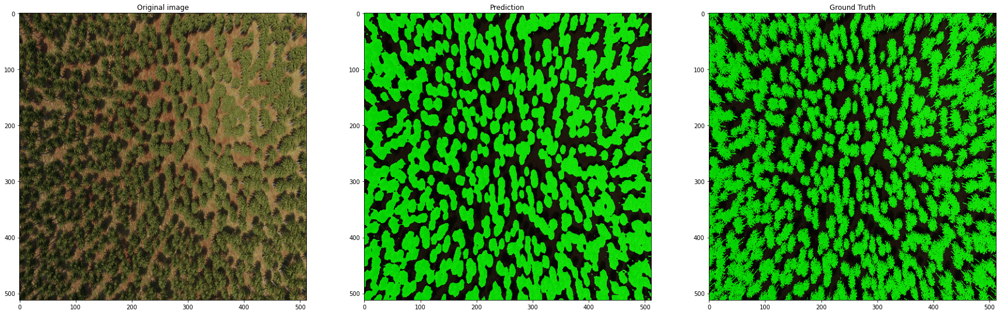

In [22]:
X, y = test_datagen[10]
predictions = model(X).numpy().argmax(axis = 3)
representation = rgb_representations[predictions[0]]
representation_gt = rgb_representations[y.argmax(axis = 3)[0]]
print_legend()
fig, ax = plt.subplots(1, 3, figsize = (30,30))
ax[0].set_title('Original image')
ax[0].imshow(X[0])

ax[1].set_title('Prediction')
ax[1].imshow(X[0])
ax[1].imshow(representation, alpha = 0.8)
ax[2].set_title('Ground Truth')
ax[2].imshow(X[0])
ax[2].imshow(representation_gt, alpha = 0.8)
plt.show()

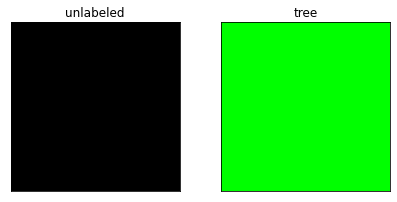

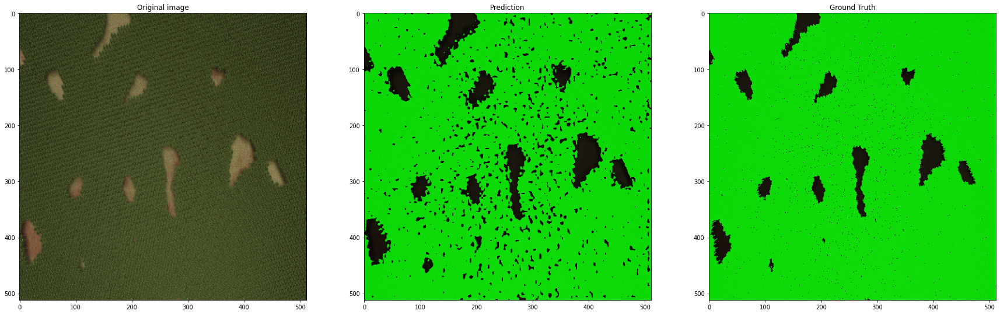

In [12]:
X = cv2.imread('input/results_actual/img/0015.jpg', cv2.IMREAD_ANYCOLOR)
X = cv2.cvtColor(X, cv2.COLOR_BGR2RGB)/255
X = cv2.resize(X, (512, 512))
X = np.expand_dims(X, axis=0)

y = cv2.imread('input/results_actual/seg/0015.jpg', cv2.IMREAD_GRAYSCALE)
y = cv2.resize(y, (512, 512))
y = (y>0).astype(np.uint8)
y = np.expand_dims(y, axis=0)

predictions = model(X).numpy().argmax(axis = 3)
representation = rgb_representations[predictions[0]]
representation_gt = rgb_representations[y[0]]
print_legend()
fig, ax = plt.subplots(1, 3, figsize = (30,30))
ax[0].set_title('Original image')
ax[0].imshow(X[0])

ax[1].set_title('Prediction')
ax[1].imshow(X[0])
ax[1].imshow(representation, alpha = 0.8)
ax[2].set_title('Ground Truth')
ax[2].imshow(X[0])
ax[2].imshow(representation_gt, alpha = 0.8)
plt.show()

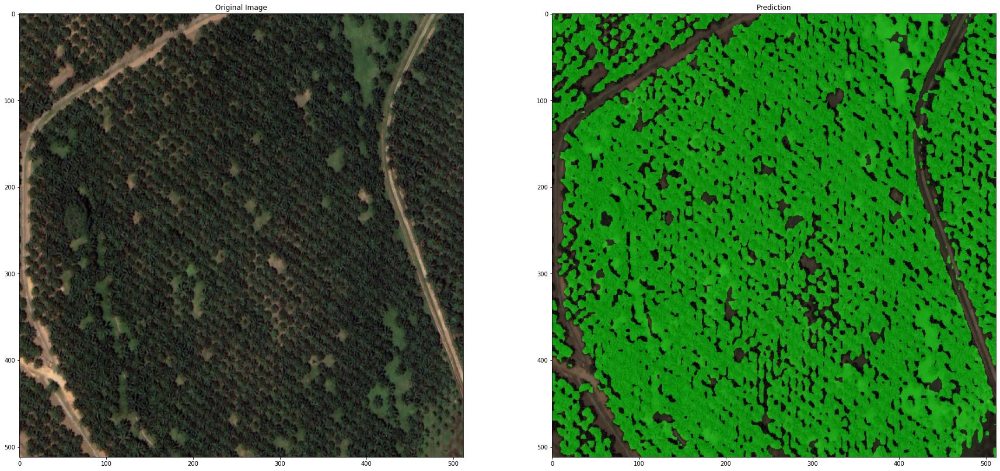

In [23]:
X = cv2.imread('tekong.jpg', cv2.IMREAD_ANYCOLOR)
X = cv2.cvtColor(X, cv2.COLOR_BGR2RGB)/255
X = cv2.resize(X, (512, 512))
X = np.expand_dims(X, axis=0)

predictions = model(X).numpy().argmax(axis = 3)
representation = rgb_representations[predictions[0]]

fig, ax = plt.subplots(1, 2, figsize = (30,30))
ax[0].set_title('Original Image')
ax[0].imshow(X[0])
ax[1].set_title('Prediction')
ax[1].imshow(X[0])
ax[1].imshow(representation, alpha=0.5)